In [1]:
import pandas as pd
import numpy as np

import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.pyplot import figure



In [2]:
import networkx as nx
import nxviz as nv

/opt/tljh/user/envs/jake_sc_eda/lib/python3.10/site-packages/nxviz/__init__.py:18: UserWarning: 
nxviz has a new API! Version 0.7.4 onwards, the old class-based API is being
deprecated in favour of a new API focused on advancing a grammar of network
graphics. If your plotting code depends on the old API, please consider
pinning nxviz at version 0.7.4, as the new API will break your old code.

To check out the new API, please head over to the docs at
https://ericmjl.github.io/nxviz/ to learn more. We hope you enjoy using it!

(This deprecation message will go away in version 1.0.)

  warnings.warn(


In [3]:
from nxviz import utils 

In [4]:
nwko = pd.read_csv('Sankey_output.csv')
nwko

,Unnamed: 0,drug_col_relation_id,drug_row_relation_id,synergy_bliss_max,cell_line_name,preds_mean,preds_std,score,round,relation_id_x,name_x,relation_id_y,name_y
0,0,RE-MOL-0001495947,RE-MOL-0000575642,0.0,MCF7,32.175810,3.475047,35.650857,Calibration,RE-MOL-0001495947,hhgv-678,RE-MOL-0000575642,cabazitaxel
1,1,RE-MOL-0001140916,RE-MOL-0000575642,24.1,MCF7,15.764807,6.448794,22.213601,SMO Round 1,RE-MOL-0001140916,dacomitinib,RE-MOL-0000575642,cabazitaxel
2,2,RE-MOL-0000584536,RE-MOL-0000575642,1.9,MCF7,15.379181,4.574558,19.953739,SMO Round 1,RE-MOL-0000584536,bms-582949,RE-MOL-0000575642,cabazitaxel
3,3,RE-MOL-0001376287,RE-MOL-0000575642,10.1,MCF7,13.956803,6.015639,19.972443,SMO Round 1,RE-MOL-0001376287,spebrutinib,RE-MOL-0000575642,cabazitaxel
4,4,RE-MOL-0000019937,RE-MOL-0000575642,3.6,MCF7,20.723950,7.460007,28.183956,Diversity,RE-MOL-0000019937,terazosin,RE-MOL-0000575642,cabazitaxel
...,...,...,...,...,...,...,...,...,...,...,...,...,...
141,141,RE-MOL-0001317309,RE-MOL-0000584456,23.7,MCF7,12.503742,2.832405,15.336147,Diversity,RE-MOL-0001317309,apatinib,RE-MOL-0000584456,vemurafenib
142,142,RE-MOL-0000001178,RE-MOL-0000584456,12.2,MCF7,14.873702,4.925148,19.798850,SMO Round 1,RE-MOL-0000001178,trifluoperazine,RE-MOL-0000584456,vemurafenib
143,143,RE-MOL-0001495681,RE-MOL-0000408487,25.4,MCF7,16.275003,4.709943,20.984946,SMO Round 3,RE-MOL-0001495681,ribociclib,RE-MOL-0000408487,vismodegib
144,144,RE-MOL-0000401940,RE-MOL-0000408487,-1.9,MCF7,11.486040,2.463049,13.949089,Diversity,RE-MOL-0000401940,pd-0325901,RE-MOL-0000408487,vismodegib


In [5]:
nwko.drop(columns=['Unnamed: 0','drug_col_relation_id','drug_row_relation_id', 'cell_line_name','preds_mean','preds_std','score', 'relation_id_x', 'relation_id_y'], inplace=True)
nwko.rename(columns = {'name_x':'source','name_y':'target'}, inplace=True)
nwko

,synergy_bliss_max,round,source,target
0,0.0,Calibration,hhgv-678,cabazitaxel
1,24.1,SMO Round 1,dacomitinib,cabazitaxel
2,1.9,SMO Round 1,bms-582949,cabazitaxel
3,10.1,SMO Round 1,spebrutinib,cabazitaxel
4,3.6,Diversity,terazosin,cabazitaxel
...,...,...,...,...
141,23.7,Diversity,apatinib,vemurafenib
142,12.2,SMO Round 1,trifluoperazine,vemurafenib
143,25.4,SMO Round 3,ribociclib,vismodegib
144,-1.9,Diversity,pd-0325901,vismodegib


In [6]:
tmp1 = nwko[['round','source','synergy_bliss_max']].rename(columns={'round':'source','source':'target'})
tmp2 = nwko[['source','target','synergy_bliss_max']].rename(columns={'source':'source','target':'target'})
tmp3 = nwko[['round','target','synergy_bliss_max']].rename(columns={'round':'source','target':'target'})
# and flip
tmp4 = nwko[['source','round','synergy_bliss_max']].rename(columns={'round':'target','source':'source'})
tmp5 = nwko[['target','source','synergy_bliss_max']].rename(columns={'source':'target','target':'source'})
tmp6 = nwko[['target','round','synergy_bliss_max']].rename(columns={'round':'target','target':'source'})

In [7]:
nwk = pd.concat([ tmp1,tmp2,tmp3,tmp4,tmp5,tmp6 ], axis=0, join ='outer')

In [8]:
nwk['scaled_synergy'] =  (( (nwk.synergy_bliss_max + 1.9) / (93.3 + 1.9) ) )
nwk['scaled_synergy_r'] = 1 - nwk['scaled_synergy']
#nwk = nwk.merge(update_names, left_on="drug_col_relation_id", right_on="relation_id")
#nwk = nwk.merge(update_names, left_on="drug_row_relation_id", right_on="relation_id")
nwk

,source,target,synergy_bliss_max,scaled_synergy,scaled_synergy_r
0,Calibration,hhgv-678,0.0,0.019958,0.980042
1,SMO Round 1,dacomitinib,24.1,0.273109,0.726891
2,SMO Round 1,bms-582949,1.9,0.039916,0.960084
3,SMO Round 1,spebrutinib,10.1,0.126050,0.873950
4,Diversity,terazosin,3.6,0.057773,0.942227
...,...,...,...,...,...
141,vemurafenib,Diversity,23.7,0.268908,0.731092
142,vemurafenib,SMO Round 1,12.2,0.148109,0.851891
143,vismodegib,SMO Round 3,25.4,0.286765,0.713235
144,vismodegib,Diversity,-1.9,0.000000,1.000000


In [9]:
nwk[nwk.scaled_synergy == 1]

,source,target,synergy_bliss_max,scaled_synergy,scaled_synergy_r
87,SMO Round 2,alfacalcidol,93.3,1.0,0.0
87,alfacalcidol,crizotinib,93.3,1.0,0.0
87,SMO Round 2,crizotinib,93.3,1.0,0.0
87,alfacalcidol,SMO Round 2,93.3,1.0,0.0
87,crizotinib,alfacalcidol,93.3,1.0,0.0
87,crizotinib,SMO Round 2,93.3,1.0,0.0


In [10]:
my_dict1 = dict.fromkeys(nwko['source'].unique(),'Drug Set A')
my_dict2 = dict.fromkeys(nwko['target'].unique(),'Drug Set B')
my_dict3 = dict.fromkeys(nwko['round'].unique(),'Round profiled')
my_dict = {**my_dict1, **my_dict2, **my_dict3}

In [11]:
len(my_dict1.keys())

54

In [12]:
len(my_dict2.keys())

37

In [13]:
len(my_dict3.keys())

5

In [14]:
G = nx.from_pandas_edgelist(nwk, 
                            source = 'source', 
                            target = "target", 
                            edge_key="synergy_bliss_max",
    create_using=nx.MultiGraph(),
                            edge_attr=["synergy_bliss_max","scaled_synergy","scaled_synergy_r"])
G = G.to_undirected()
nx.set_node_attributes(G, my_dict, 'Types')
nx.set_node_attributes(G, dict(nwk.groupby('source').mean().synergy_bliss_max), 'mean_synergy')

/tmp/ipykernel_545781/3195942129.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  nx.set_node_attributes(G, dict(nwk.groupby('source').mean().synergy_bliss_max), 'mean_synergy')


In [15]:
nwk.groupby('source').mean().synergy_bliss_max

/tmp/ipykernel_545781/1255098905.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  nwk.groupby('source').mean().synergy_bliss_max


source
Calibration     9.233333
Diversity      12.839286
SMO Round 1    14.286207
SMO Round 2    25.244828
SMO Round 3    25.946667
                 ...    
vemurafenib    18.120000
vinblastine    20.866667
vincristine    11.463636
vismodegib     11.750000
zoledronate     3.700000
Name: synergy_bliss_max, Length: 96, dtype: float64

In [16]:
nwk

,source,target,synergy_bliss_max,scaled_synergy,scaled_synergy_r
0,Calibration,hhgv-678,0.0,0.019958,0.980042
1,SMO Round 1,dacomitinib,24.1,0.273109,0.726891
2,SMO Round 1,bms-582949,1.9,0.039916,0.960084
3,SMO Round 1,spebrutinib,10.1,0.126050,0.873950
4,Diversity,terazosin,3.6,0.057773,0.942227
...,...,...,...,...,...
141,vemurafenib,Diversity,23.7,0.268908,0.731092
142,vemurafenib,SMO Round 1,12.2,0.148109,0.851891
143,vismodegib,SMO Round 3,25.4,0.286765,0.713235
144,vismodegib,Diversity,-1.9,0.000000,1.000000


In [17]:
nwk.source

0      Calibration
1      SMO Round 1
2      SMO Round 1
3      SMO Round 1
4        Diversity
          ...     
141    vemurafenib
142    vemurafenib
143     vismodegib
144     vismodegib
145    ruxolitinib
Name: source, Length: 876, dtype: object

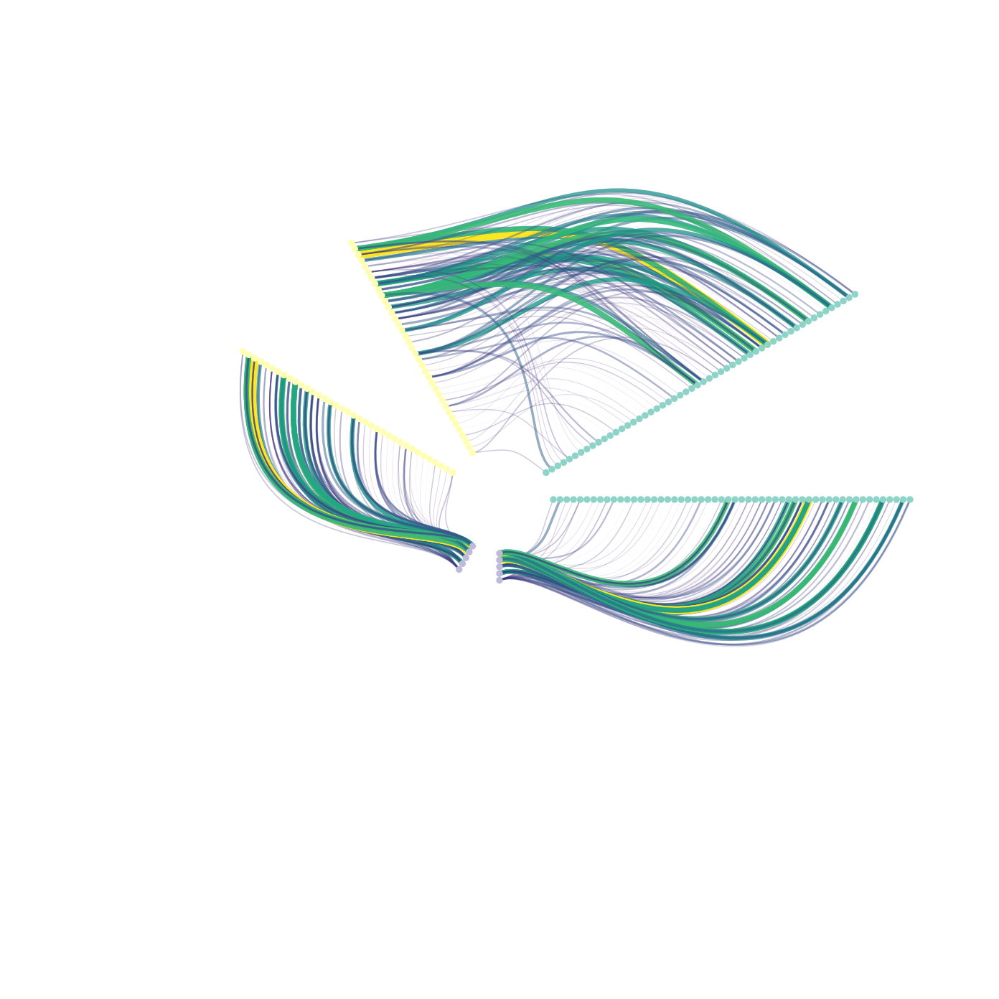

In [18]:
figure(figsize=(2, 2), dpi=800)

plt.set_cmap("rocket_r")

ax = nv.hive(G, group_by="Types",
        node_color_by="Types", 
        edge_color_by="scaled_synergy", 
        edge_alpha_by="scaled_synergy", 
        edge_lw_by="scaled_synergy" ) # , node_color_by="gender"), edge_color_by="Type" 

# plt.savefig("rand_fig.png", format="png", dpi=800, bbox_inches="tight")
plt.show()


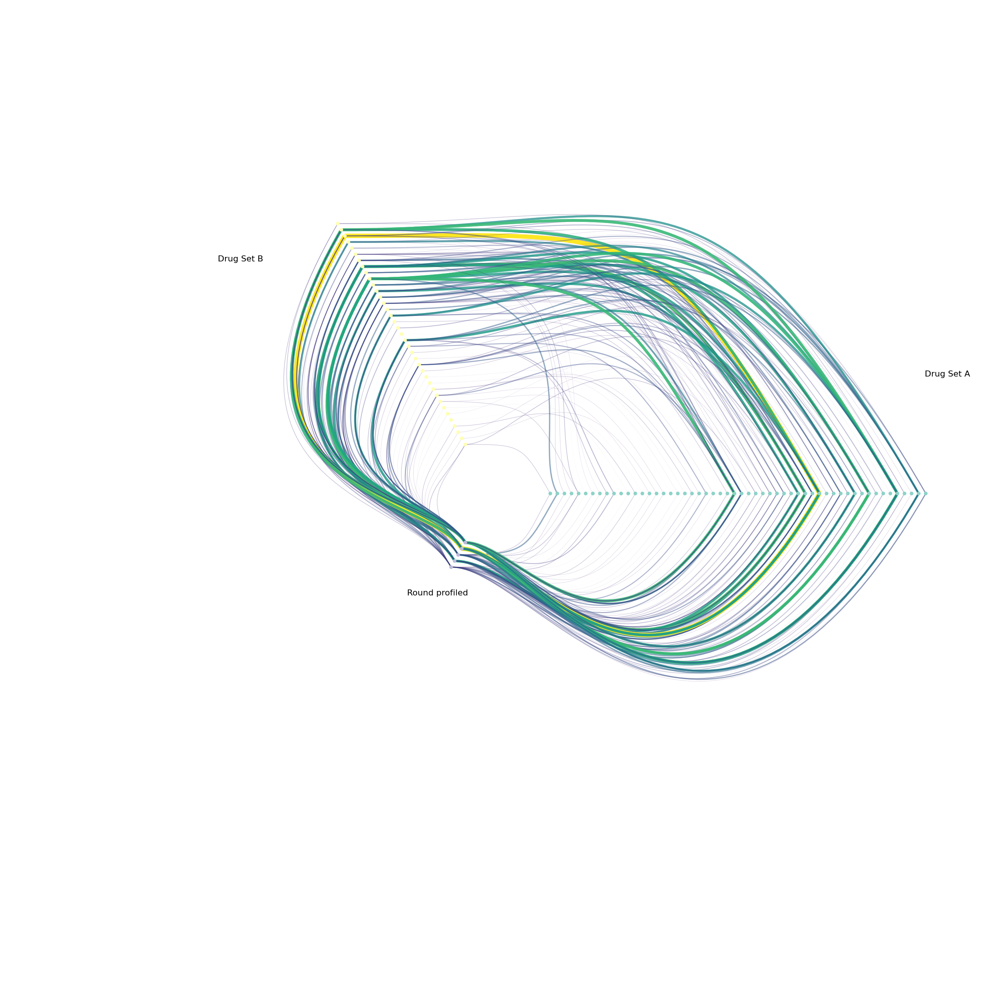

In [19]:
from nxviz import nodes, edges, annotate, utils
from nxviz.plots import aspect_equal, despine 


ax_dash = figure(figsize=(4, 4), dpi=800)
pos_dash = nodes.hive(G, group_by="Types", color_by= "Types" ) 
pos_cloned_dash = nodes.hive( G, group_by="Types", color_by= "Types", layout_kwargs=dict(rotation=0.0001) ) # dict(rotation=np.pi / 6)
edges.hive(G, pos = pos_dash, pos_cloned=pos_cloned_dash, 
           alpha_by= "scaled_synergy", 
           color_by = "scaled_synergy", 
           lw_by= "scaled_synergy" ) 
#annotate.node_colormapping(G, color_by="Types")
annotate.hive_group(G,group_by="Types", fontdict=dict(size=2) )
despine() 
aspect_equal()

In [20]:
#et = utils.edge_table(G) 
#et.head()

In [21]:
from nxviz import nodes, plots, lines, layouts
import matplotlib.pyplot as plt 
import pandas as pd 
from nxviz import encodings as aes 

def group_colormap(data: pd.Series): 
    cmap = {"Drug Set A": "red", "Drug Set B": "blue", "Round profiled": "black"} 
    return data.apply(lambda x: cmap.get(x)) 




In [22]:
#ax = figure(figsize=(4, 4), dpi=800)

#ax = plt.gca() # Customize node styling 

#nt = utils.node_table(G) 
#nt['node_size'] = (nt.mean_synergy + 5)/20
#pos = layouts.hive(nt, group_by="Types", sort_by="mean_synergy") 
#pos_cloned = layouts.hive(nt, group_by="Types", sort_by="mean_synergy", rotation=0.0001) 
#node_color = group_colormap(nt["Types"]) 
#alpha = nodes.transparency(nt, alpha_by=None) 
#size = nodes.node_size(nt, "node_size") 
#patches = nodes.node_glyphs( nt, pos, node_color=node_color, alpha=alpha, size=size ) 
#for patch in patches: 
#    ax.add_patch(patch)  
#plots.rescale(G) 
#plots.aspect_equal() 

In [23]:
from nxviz import lines # Customize node styling 
from adjustText import adjust_text
from matplotlib import pyplot as plt, colors


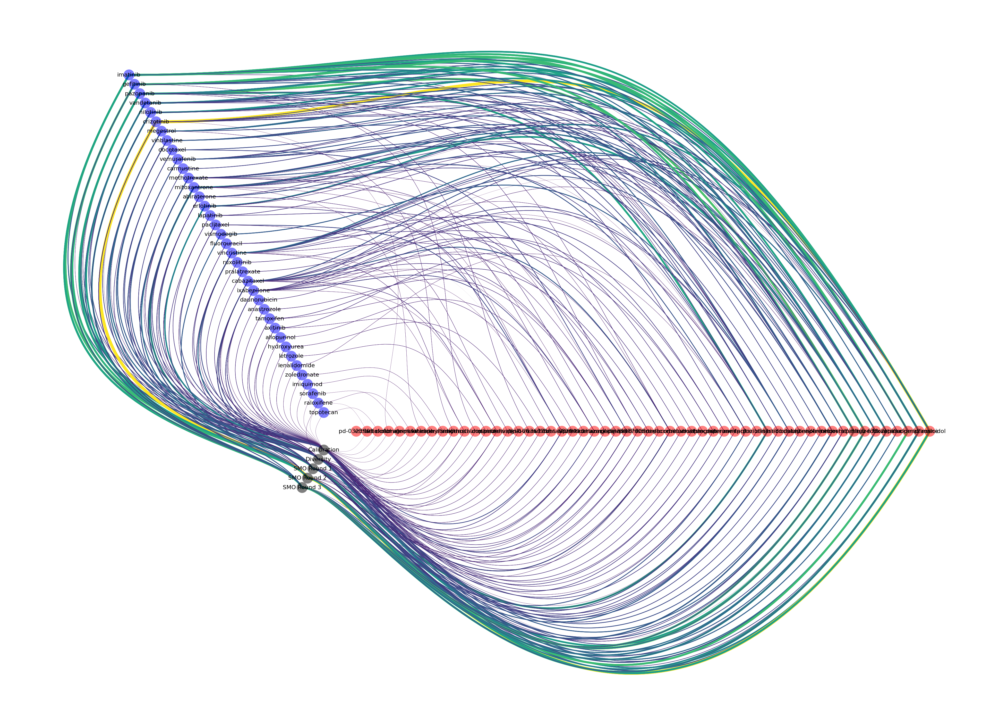

In [24]:
ax = figure(figsize=(6, 6), dpi=800)


ax = plt.gca() # Customize node styling 

nt = utils.node_table(G) 
nt['node_size'] = (nt.mean_synergy + 5)/20
pos = layouts.hive(nt, group_by="Types", sort_by="mean_synergy", inner_radius = 2) 
pos_cloned = layouts.hive(nt, group_by="Types", sort_by="mean_synergy", rotation= 0.0001, inner_radius = 2) 
#for a in ["1","2","3","4","5"]:
#    pos[a] = pos[a] * 3
#    pos_cloned[a] = pos_cloned[a] * 3
node_color = group_colormap(nt["Types"]) 
alpha = nodes.transparency(nt, alpha_by=None) * 0.5
size = nodes.node_size(nt, "node_size") 
size = size / size
patches = nodes.node_glyphs( nt, pos, node_color=node_color, alpha=alpha, size=size ) 
for patch in patches: 
    ax.add_patch(patch)   
# edges 
et = utils.edge_table(G) 
et['lwid'] = et['scaled_synergy'] * 1
edge_color = edges.edge_colors(et, nt=None, color_by="scaled_synergy", node_color_by=None)
lw = edges.line_width(et, lw_by="lwid") 
alpha = edges.transparency(et, alpha_by="scaled_synergy") 
alpha = alpha*0 + 1
patches = lines.hive( et, pos = pos, pos_cloned=pos_cloned, edge_color=edge_color, alpha=alpha, lw=lw , aes_kw={"fc": "none"} )
for patch in patches: 
    ax.add_patch(patch) 
    
texts = [plt.text(x = pos[ii][0], y=  pos[ii][1], s = ii, ha='center', va='center', fontsize=2) for ii in pos.keys()]

plots.rescale(G) 
plots.aspect_equal() 
plots.despine() 

#adjust_text(texts)


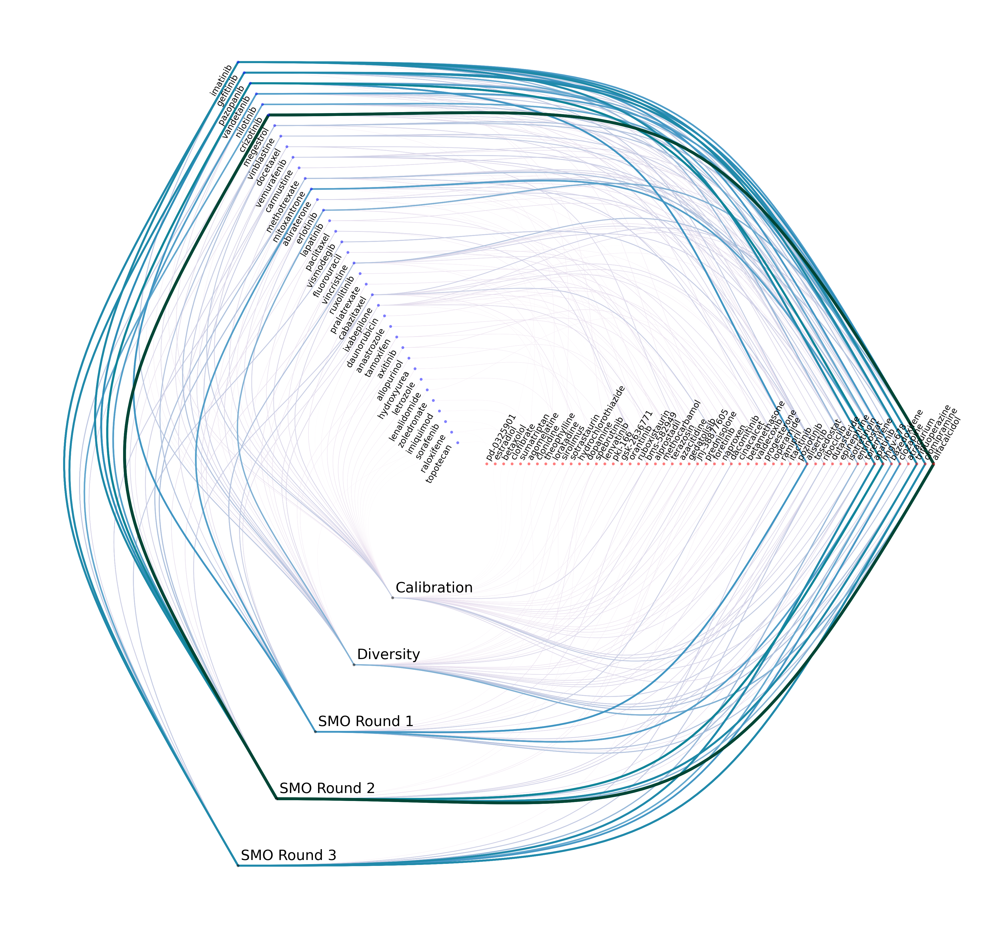

<Figure size 640x480 with 0 Axes>

In [25]:

cmap = plt.cm.PuBuGn
norm = colors.Normalize(vmin=0, vmax=1)

# pick colours 


ax = figure(figsize=(6, 6), dpi=800)

ax = plt.gca() # Customize node styling 

nt = utils.node_table(G) 
nt['node_size'] = (nt.mean_synergy + 5)/20
pos = layouts.hive(nt, group_by="Types", sort_by="mean_synergy", inner_radius = 2, rotation= 0*(-np.pi/3 - np.pi/2)  ) 
pos_cloned = layouts.hive(nt, group_by="Types", sort_by="mean_synergy", inner_radius = 2, rotation= 0*( -np.pi/3 - np.pi/2)  +  0.0001) 

scale_fac = 3

for a in my_dict1.keys():
    pos[a] = pos[a] * scale_fac
    pos_cloned[a] = pos_cloned[a] * scale_fac
    
for a in my_dict2.keys():
    pos[a] = pos[a] * scale_fac * (110 / 76)
    pos_cloned[a] = pos_cloned[a] * scale_fac

for a in my_dict3.keys():
    pos[a] = pos[a] * scale_fac * (110 / 12)
    pos_cloned[a] = pos_cloned[a] * scale_fac * (110 / 12)

node_color = group_colormap(nt["Types"]) 
alpha = nodes.transparency(nt, alpha_by=None) * 0.5
size = nodes.node_size(nt, "node_size") 
size = size / size
patches = nodes.node_glyphs( nt, pos, node_color=node_color, alpha=alpha, size=size ) 
for patch in patches: 
    ax.add_patch(patch)   
# edges 
et = utils.edge_table(G) 
et = et.sort_values(by = 'scaled_synergy')
et.index = range(len(et))
et['lwid'] = et['scaled_synergy'] * 1
#edge_color = edges.edge_colors(et, nt=None, color_by="scaled_synergy", node_color_by=None)
lw = edges.line_width(et, lw_by="lwid") 
alpha = edges.transparency(et, alpha_by="scaled_synergy") 
alpha = alpha*0 + 1

#palette_names = ["rocket", "flare", "Blues", "viridis"] # You can add any of these https://jiffyclub.github.io/palettable/colorbrewer/sequential/
#palettes = {
#    palette_name: sns.color_palette(palette_name, len(et)) for palette_name in palette_names
#}
ed_colours = [cmap(norm(et.scaled_synergy[ii]))[:3] for ii in range(len(et))]


patches = lines.hive( et, pos = pos, pos_cloned=pos_cloned, edge_color=ed_colours, alpha=alpha, lw=lw , aes_kw={"fc": "none"} ) # , 
for patch in patches: 
    ax.add_patch(patch) 
    
#texts = [plt.text(x = pos[ii][0], y=  pos[ii][1], s = ii, ha='center', va='center', fontsize=2) for ii in pos.keys()]

texts=[]
for ii in pos.keys():
    if ii in my_dict1.keys():
        texts += [plt.text(x = pos[ii][0]-2, y=  pos[ii][1]+2, s = ii, ha='left', va='bottom', fontsize=3, rotation = 60)]
    if ii in my_dict2.keys():
        texts += [plt.text(x = pos[ii][0]-3, y=  pos[ii][1], s = ii, ha='right', va='top', fontsize=3, rotation = 60)]
    if ii in my_dict3.keys():
        texts += [plt.text(x = pos[ii][0] + 2, y=  pos[ii][1] + 2, s = ii, ha='left', va='bottom', fontsize=5)]

    
    
plots.rescale(G) 
plots.aspect_equal() 
plots.despine() 

#adjust_text(texts)


plt.savefig("additional_figures/nwk_graphic.png", dpi=800,bbox_inches='tight', pad_inches=0.01)
plt.show()
plt.clf()


In [26]:
#texts = [plt.text(x = pos[ii][0], y=  pos[ii][1], s = ii, ha='center', va='center', fontsize=2) for ii in pos.keys()]



In [27]:
pos.keys()

dict_keys(['pd-0325901', 'estradiol', 'betaxolol', 'clofibrate', 'sumatriptan', 'agomelatine', 'clonidine', 'theophylline', 'loratadine', 'sirolimus', 'sotrastaurin', 'hydrochlorothiazide', 'dopamine', 'spebrutinib', 'lenvatinib', 'pki-166', 'gsk-2636771', 'orantinib', 'ruboxistaurin', 'bms-582949', 'alprostadil', 'methocarbamol', 'terazosin', 'azacitidine', 'gedatolisib', 'jnj-38877605', 'prednisolone', 'foretinib', 'naproxen', 'dacomitinib', 'cinacalcet', 'betamethasone', 'valdecoxib', 'progesterone', 'loperamide', 'ramipril', 'itacitinib', 'poziotinib', 'alisertib', 'tosedostat', 'ribociclib', 'dutasteride', 'epinephrine', 'isotretinoin', 'entinostat', 'toremifene', 'apatinib', 'hhgv-678', 'bazedoxifene', 'clozapine', 'atracurium', 'trifluoperazine', 'clomipramine', 'alfacalcidol', 'topotecan', 'raloxifene', 'sorafenib', 'imiquimod', 'zoledronate', 'lenalidomide', 'letrozole', 'hydroxyurea', 'allopurinol', 'axitinib', 'tamoxifen', 'anastrozole', 'daunorubicin', 'ixabepilone', 'cabaz

In [28]:
(110 / 76)

1.4473684210526316

In [29]:
pos

{'pd-0325901': array([12.,  0.]),
 'estradiol': array([18.,  0.]),
 'betaxolol': array([24.,  0.]),
 'clofibrate': array([30.,  0.]),
 'sumatriptan': array([36.,  0.]),
 'agomelatine': array([42.,  0.]),
 'clonidine': array([48.,  0.]),
 'theophylline': array([54.,  0.]),
 'loratadine': array([60.,  0.]),
 'sirolimus': array([66.,  0.]),
 'sotrastaurin': array([72.,  0.]),
 'hydrochlorothiazide': array([78.,  0.]),
 'dopamine': array([84.,  0.]),
 'spebrutinib': array([90.,  0.]),
 'lenvatinib': array([96.,  0.]),
 'pki-166': array([102.,   0.]),
 'gsk-2636771': array([108.,   0.]),
 'orantinib': array([114.,   0.]),
 'ruboxistaurin': array([120.,   0.]),
 'bms-582949': array([126.,   0.]),
 'alprostadil': array([132.,   0.]),
 'methocarbamol': array([138.,   0.]),
 'terazosin': array([144.,   0.]),
 'azacitidine': array([150.,   0.]),
 'gedatolisib': array([156.,   0.]),
 'jnj-38877605': array([162.,   0.]),
 'prednisolone': array([168.,   0.]),
 'foretinib': array([174.,   0.]),
 'na

In [30]:
np.sqrt(10.39230485 ** 2 + 36)

12.00000000397223

In [31]:

et[630:647]

,synergy_bliss_max,scaled_synergy,scaled_synergy_r,source,target,lwid
630,20.9,0.239496,0.760504,entinostat,abiraterone,0.239496
631,20.9,0.239496,0.760504,abiraterone,entinostat,0.239496
632,20.9,0.239496,0.760504,abiraterone,Calibration,0.239496
633,20.9,0.239496,0.760504,Calibration,entinostat,0.239496
634,21.0,0.240546,0.759454,nilotinib,SMO Round 3,0.240546
635,21.0,0.240546,0.759454,nilotinib,entinostat,0.240546
636,21.0,0.240546,0.759454,SMO Round 3,entinostat,0.240546
637,21.0,0.240546,0.759454,SMO Round 3,nilotinib,0.240546
638,21.0,0.240546,0.759454,entinostat,SMO Round 3,0.240546
639,21.0,0.240546,0.759454,entinostat,nilotinib,0.240546


In [32]:
ed_colours = [cmap(norm(et.scaled_synergy[ii]))[:3] for ii in range(len(et))]
et.max()

synergy_bliss_max           93.3
scaled_synergy               1.0
scaled_synergy_r             1.0
source               zoledronate
target               zoledronate
lwid                         1.0
dtype: object

In [33]:
palettes['rocket'][0:10]

NameError: name 'palettes' is not defined

In [ ]:
et

In [ ]:
link_colours

In [ ]:
alpha

In [ ]:
group_colormap